In [44]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
import glob
from pathlib import Path
import random
from collections import Counter
import shutil

In [45]:
# For image processing and visualization
from skimage import io, color, measure
from skimage.segmentation import mark_boundaries
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [46]:
# Setting random seed for reproducibility
random.seed(42)
np.random.seed(42)

In [47]:
# Configure matplotlib for better visualizations
plt.style.use('fivethirtyeight')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

In [48]:
# Path to the dataset.csv file
csv_path = '../data/MSFD/1/dataset.csv'

# Load the CSV file into a DataFrame
df = pd.read_csv(csv_path)

# Display the first few rows
df.head()

,filename,x1,y1,x2,y2,with_mask
0,000000.jpg,149,0,513,393,True
1,000001.jpg,119,28,157,79,True
2,000002.jpg,109,51,180,136,True
3,000003.jpg,263,40,703,679,True
4,000004.jpg,137,9,163,39,True


In [49]:
# Check for null values
df.isnull().sum()

filename     0
x1           0
y1           0
x2           0
y2           0
with_mask    0
dtype: int64

In [50]:
# Summary of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11510 entries, 0 to 11509
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   filename   11510 non-null  object
 1   x1         11510 non-null  int64 
 2   y1         11510 non-null  int64 
 3   x2         11510 non-null  int64 
 4   y2         11510 non-null  int64 
 5   with_mask  11510 non-null  bool  
dtypes: bool(1), int64(4), object(1)
memory usage: 461.0+ KB


In [51]:
# Summary statistics
df.describe()

,x1,y1,x2,y2
count,11510.000000,11510.000000,11510.000000,11510.000000
mean,331.666030,194.165334,597.156820,556.209296
std,202.135946,173.189826,258.268238,300.511255
min,0.000000,0.000000,7.000000,14.000000
25%,185.000000,69.000000,414.000000,293.000000
50%,312.000000,153.000000,624.000000,566.000000
75%,445.000000,264.000000,783.000000,795.000000
max,3070.000000,1258.000000,3783.000000,2369.000000


In [52]:
dataset_dir = '../data/MSFD'

# List contents of the base directory
for root, dirs, files in os.walk(dataset_dir):
    print(f'Root: {root}\nDirectories: {dirs}\nFiles: {files}\n')

Root: ../data/MSFD
Directories: ['2', '1']
Files: []

Root: ../data/MSFD/2
Directories: ['img']
Files: []

Root: ../data/MSFD/2/img
Directories: []
Files: ['thinkbespoke_117264611_336721360666525_4667183654495831682_n.jpg', 'ceylon_queenbees_300194723_147358067976012_8112364895157069245_n.jpg', 'jessielee2012_136189910_227586675529522_41157188443515372_n.jpg', 'stilotravel_158443400_917380849014472_9161119203972242267_n.jpg', 'rpmasksnz_276002924_268270168691513_2137804166185715614_n.jpg', 'airinum.hk_299780140_1697762817264902_2534972003115865926_n.jpg', 'rpmasksnz_275074702_448287047083427_6227326558632707129_n.jpg', 'wearmaskandgloves_117428306_1247328142287429_1360353850709607909_n.jpg', 'stoneclothes2017_154816712_336571257740562_94720217244146837_n.jpg', 'baaswara_300981992_189263393500330_3394053598325250717_n.jpg', 'masarmedicalfactory_299703356_359688429542936_2158162157518178819_n.jpg', 'prince_j_juice_278886982_116829570995554_3837297959691150708_n.jpg', 'uniktardbykiki_1418

In [53]:
# Cell 2: Define paths and explore directory structure
base_dir = '../data/MSFD'
data_dirs = ['/1', '/2']

In [54]:
# Function to explore directory structure
def explore_directory(directory):
    print(f"Exploring directory: {directory}")
    for root, dirs, files in os.walk(directory):
        level = root.replace(directory, '').count(os.sep)
        indent = ' ' * 4 * level
        print(f"{indent}{os.path.basename(root)}/")
        sub_indent = ' ' * 4 * (level + 1)
        for file in files[:5]:  # Show only first 5 files to avoid clutter
            print(f"{sub_indent}{file}")
        if len(files) > 5:
            print(f"{sub_indent}... and {len(files)-5} more files")

# Explore the directory structure
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    explore_directory(full_path)

Exploring directory: ../data/MSFD/1
1/
    dataset.csv
    face_crop/
        003922_1.jpg
        002838_1.jpg
        007342_2.jpg
        005755_1.jpg
        007569_1.jpg
        ... and 9378 more files
    face_crop_segmentation/
        003922_1.jpg
        002838_1.jpg
        007342_2.jpg
        005755_1.jpg
        007569_1.jpg
        ... and 9378 more files
    img/
        001399.jpg
        004027.jpg
        006106.jpg
        007787.jpg
        003832.jpg
        ... and 8221 more files
Exploring directory: ../data/MSFD/2
2/
    img/
        thinkbespoke_117264611_336721360666525_4667183654495831682_n.jpg
        ceylon_queenbees_300194723_147358067976012_8112364895157069245_n.jpg
        jessielee2012_136189910_227586675529522_41157188443515372_n.jpg
        stilotravel_158443400_917380849014472_9161119203972242267_n.jpg
        rpmasksnz_276002924_268270168691513_2137804166185715614_n.jpg
        ... and 3370 more files


In [71]:
# Cell 3: Load and examine the dataset CSV
csv_path = '../data/MSFD/1/dataset.csv'
if os.path.exists(csv_path):
    df = pd.read_csv(csv_path)
    print(f"Dataset shape: {df.shape}")
    print("\nFirst 5 rows of the dataset:")
    display(df.head())
    
    print("\nDataset info:")
    display(df.info())
    
    print("\nSummary statistics:")
    display(df.describe())
    
    print("\nColumn names:")
    print(df.columns.tolist())
else:
    print(f"CSV file not found at {csv_path}")
    # Create a placeholder DataFrame to continue the notebook
    df = pd.DataFrame()


Dataset shape: (11510, 6)

First 5 rows of the dataset:


,filename,x1,y1,x2,y2,with_mask
0,000000.jpg,149,0,513,393,True
1,000001.jpg,119,28,157,79,True
2,000002.jpg,109,51,180,136,True
3,000003.jpg,263,40,703,679,True
4,000004.jpg,137,9,163,39,True



Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11510 entries, 0 to 11509
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   filename   11510 non-null  object
 1   x1         11510 non-null  int64 
 2   y1         11510 non-null  int64 
 3   x2         11510 non-null  int64 
 4   y2         11510 non-null  int64 
 5   with_mask  11510 non-null  bool  
dtypes: bool(1), int64(4), object(1)
memory usage: 461.0+ KB


None


Summary statistics:


,x1,y1,x2,y2
count,11510.000000,11510.000000,11510.000000,11510.000000
mean,331.666030,194.165334,597.156820,556.209296
std,202.135946,173.189826,258.268238,300.511255
min,0.000000,0.000000,7.000000,14.000000
25%,185.000000,69.000000,414.000000,293.000000
50%,312.000000,153.000000,624.000000,566.000000
75%,445.000000,264.000000,783.000000,795.000000
max,3070.000000,1258.000000,3783.000000,2369.000000



Column names:
['filename', 'x1', 'y1', 'x2', 'y2', 'with_mask']


In [56]:
# Cell 4: Explore image directories and count files
image_counts = {}

for dir_path in data_dirs:
    full_path = base_dir + dir_path
    
    # Count images in each directory
    for root, dirs, files in os.walk(full_path):
        if 'img' in root or 'face_crop' in root or 'face_crop_segmentation' in root:
            image_files = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]
            image_counts[root] = len(image_files)

print("Image counts in each directory:")
for dir_name, count in image_counts.items():
    print(f"{dir_name}: {count} images")

Image counts in each directory:
../data/MSFD/1/face_crop: 9383 images
../data/MSFD/1/face_crop_segmentation: 9383 images
../data/MSFD/1/img: 8226 images
../data/MSFD/2/img: 3375 images


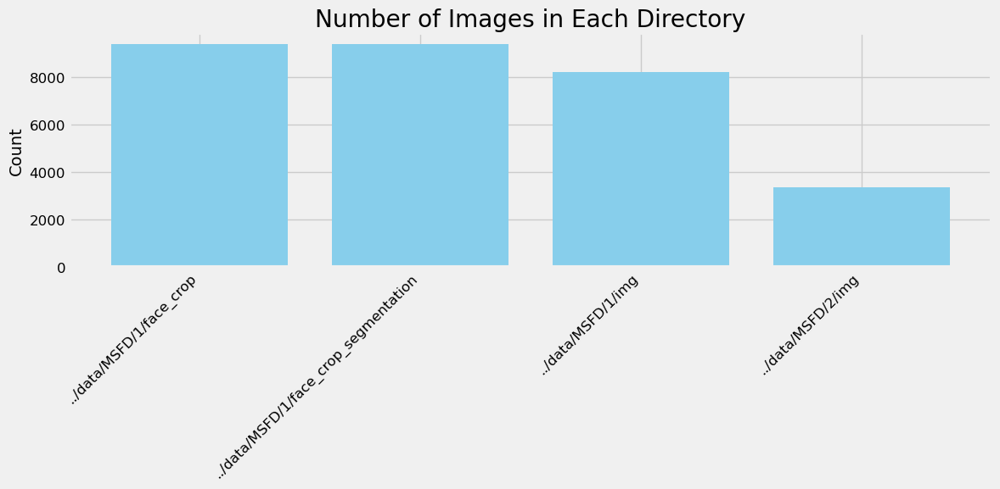

In [57]:
# Cell 5: Visualize image distribution across directories
plt.figure(figsize=(12, 6))
plt.bar(image_counts.keys(), image_counts.values(), color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.title('Number of Images in Each Directory')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

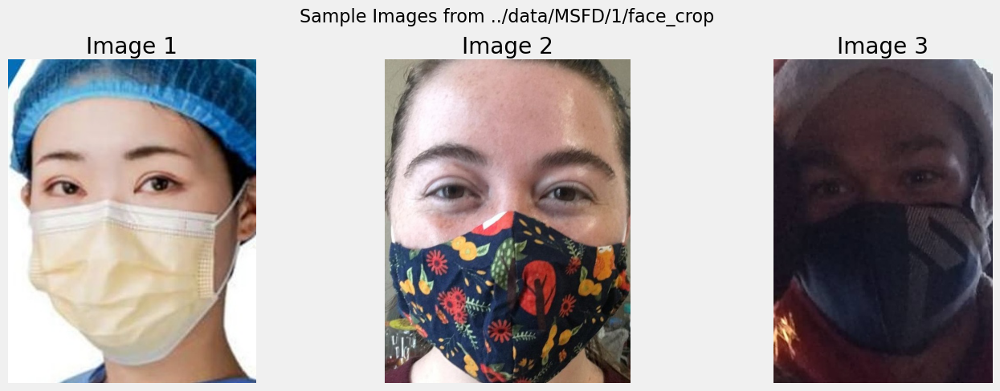

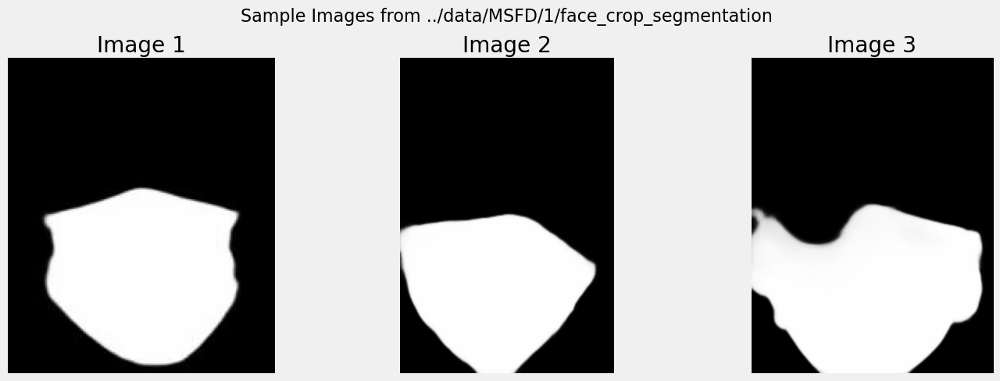

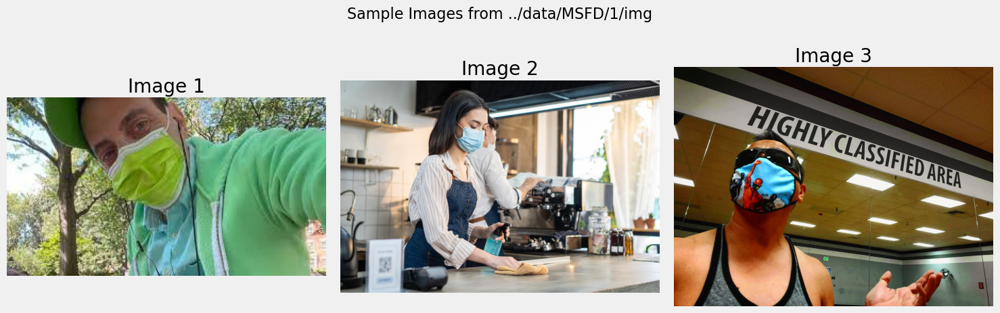

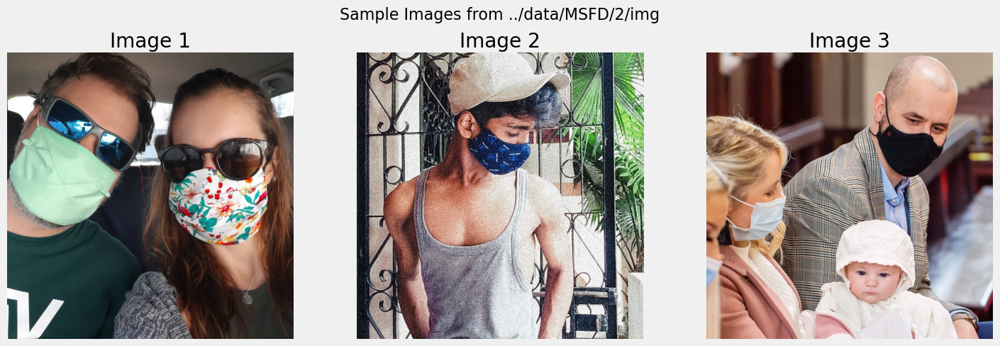

In [58]:
# Cell 6: Sample and visualize images from each directory
def sample_images(directory, n=3):
    """Sample n random images from directory"""
    image_files = glob.glob(os.path.join(directory, '*.png')) + \
                  glob.glob(os.path.join(directory, '*.jpg')) + \
                  glob.glob(os.path.join(directory, '*.jpeg'))
    
    if not image_files:
        print(f"No images found in {directory}")
        return None
    
    selected = random.sample(image_files, min(n, len(image_files)))
    return selected

# Sample images from each important directory
sample_dirs = []
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    for root, dirs, _ in os.walk(full_path):
        if 'img' in root or 'face_crop' in root or 'face_crop_segmentation' in root:
            sample_dirs.append(root)

# Function to display sample images
def display_sample_images(directories):
    for directory in directories:
        samples = sample_images(directory)
        if samples:
            plt.figure(figsize=(15, 5))
            plt.suptitle(f'Sample Images from {directory}', fontsize=16)
            
            for i, img_path in enumerate(samples):
                plt.subplot(1, len(samples), i+1)
                img = plt.imread(img_path)
                plt.imshow(img)
                plt.title(f'Image {i+1}')
                plt.axis('off')
            
            plt.tight_layout()
            plt.subplots_adjust(top=0.85)
            plt.show()

display_sample_images(sample_dirs)


Analyzing images in ../data/MSFD/1/img


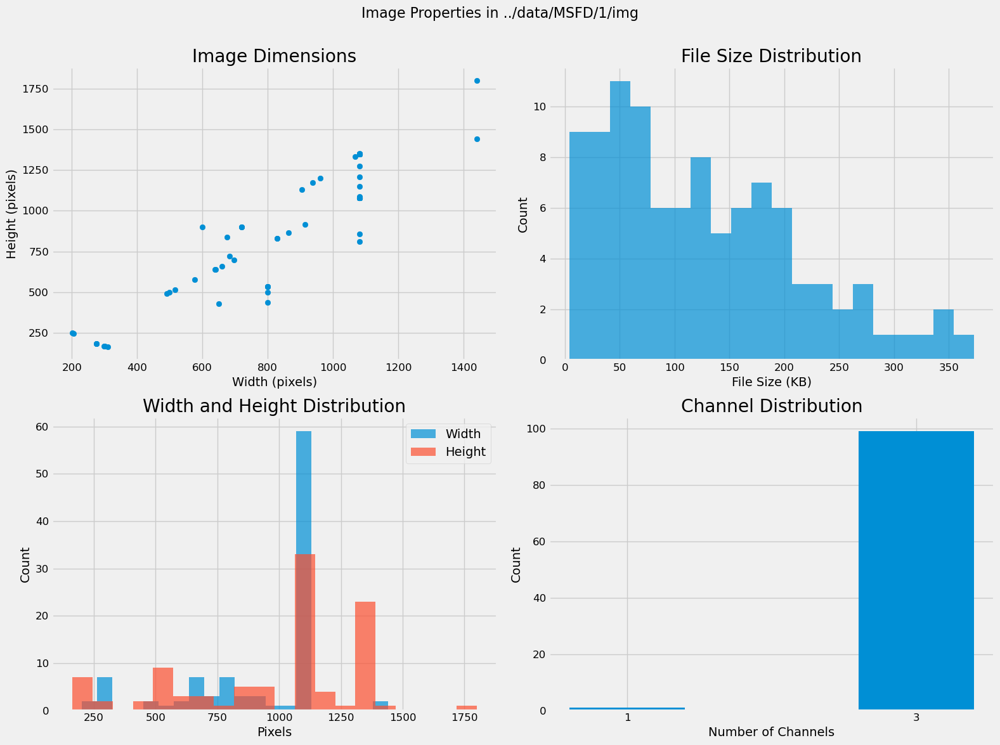

Summary statistics:
Average dimensions: 914.3 x 966.9 pixels
Average file size: 125.9 KB
Channel distribution: Counter({3: 99, 1: 1})

Analyzing images in ../data/MSFD/2/img


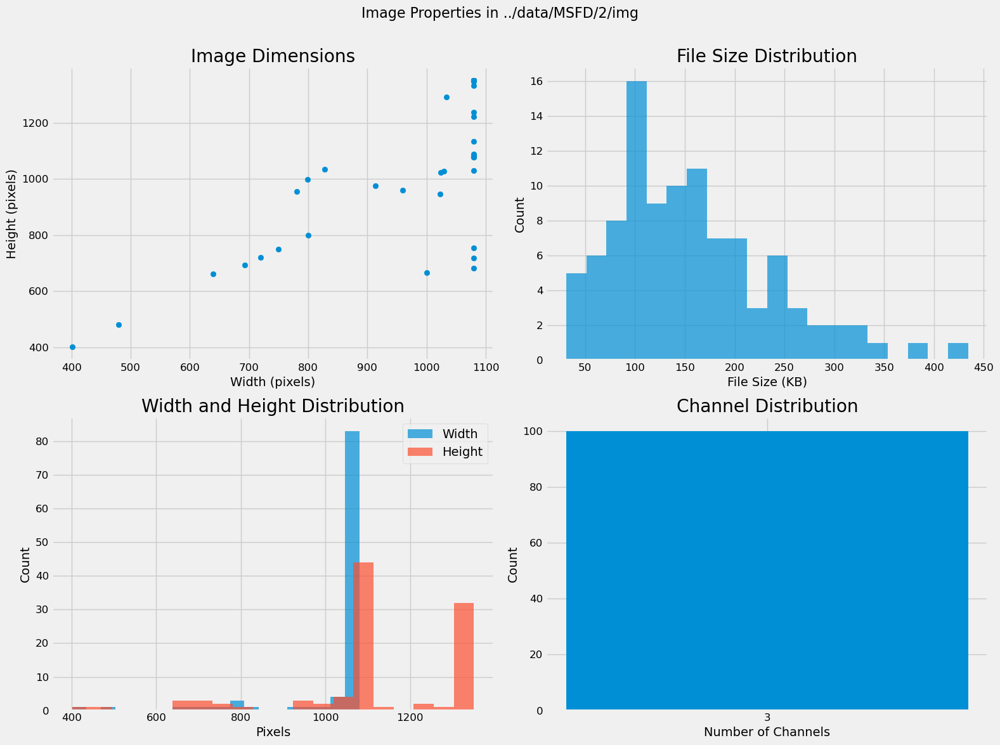

Summary statistics:
Average dimensions: 1035.2 x 1118.8 pixels
Average file size: 157.1 KB
Channel distribution: Counter({3: 100})


In [59]:
# Cell 7: Analyze image properties (size, dimensions, channels)
def analyze_image_properties(directory):
    """Analyze properties of images in a directory"""
    image_files =   glob.glob(os.path.join(directory, '*.png')) + \
                    glob.glob(os.path.join(directory, '*.jpg')) + \
                    glob.glob(os.path.join(directory, '*.jpeg'))
    
    if not image_files:
        return None
    
    # Sample at most 100 images to avoid long processing time
    sample_size = min(100, len(image_files))
    sampled_files = random.sample(image_files, sample_size)
    
    widths = []
    heights = []
    channels = []
    file_sizes = []
    
    for img_path in sampled_files:
        # Get file size in KB
        file_sizes.append(os.path.getsize(img_path) / 1024)
        
        # Get image dimensions
        img = Image.open(img_path)
        width, height = img.size
        widths.append(width)
        heights.append(height)
        
        # Get number of channels
        img_array = np.array(img)
        if len(img_array.shape) == 3:
            channels.append(img_array.shape[2])
        else:
            channels.append(1)  # Grayscale
    
    return {
        'widths': widths,
        'heights': heights,
        'channels': channels,
        'file_sizes': file_sizes
    }

# Analyze properties for a sample of directories
sample_analysis_dirs = [dir_path for dir_path in sample_dirs if 'img' in dir_path][:2]  # Limit to 2 dirs for brevity

for directory in sample_analysis_dirs:
    print(f"\nAnalyzing images in {directory}")
    properties = analyze_image_properties(directory)
    
    if properties:
        plt.figure(figsize=(16, 12))
        
        # Image dimensions
        plt.subplot(2, 2, 1)
        plt.scatter(properties['widths'], properties['heights'])
        plt.xlabel('Width (pixels)')
        plt.ylabel('Height (pixels)')
        plt.title('Image Dimensions')
        
        # File sizes
        plt.subplot(2, 2, 2)
        plt.hist(properties['file_sizes'], bins=20, alpha=0.7)
        plt.xlabel('File Size (KB)')
        plt.ylabel('Count')
        plt.title('File Size Distribution')
        
        # Image dimensions distribution
        plt.subplot(2, 2, 3)
        plt.hist(properties['widths'], bins=20, alpha=0.7, label='Width')
        plt.hist(properties['heights'], bins=20, alpha=0.7, label='Height')
        plt.xlabel('Pixels')
        plt.ylabel('Count')
        plt.title('Width and Height Distribution')
        plt.legend()
        
        # Channels distribution
        plt.subplot(2, 2, 4)
        channel_counts = Counter(properties['channels'])
        plt.bar(channel_counts.keys(), channel_counts.values())
        plt.xlabel('Number of Channels')
        plt.ylabel('Count')
        plt.title('Channel Distribution')
        plt.xticks(list(channel_counts.keys()))
        
        plt.tight_layout()
        plt.suptitle(f'Image Properties in {directory}', fontsize=16)
        plt.subplots_adjust(top=0.9)
        plt.show()
        
        # Summary statistics
        print("Summary statistics:")
        print(f"Average dimensions: {np.mean(properties['widths']):.1f} x {np.mean(properties['heights']):.1f} pixels")
        print(f"Average file size: {np.mean(properties['file_sizes']):.1f} KB")
        print(f"Channel distribution: {channel_counts}")


In [60]:
# Cell 8: Analyze face masks (segmentation)
def analyze_segmentation_masks(img_dir, mask_dir):
    """Analyze properties of segmentation masks compared to original images"""
    # Find matching images
    orig_images = glob.glob(os.path.join(img_dir, '*.png')) + \
                  glob.glob(os.path.join(img_dir, '*.jpg'))
    mask_images = glob.glob(os.path.join(mask_dir, '*.png')) + \
                  glob.glob(os.path.join(mask_dir, '*.jpg'))
    
    # Get base filenames
    orig_basenames = [os.path.basename(f) for f in orig_images]
    mask_basenames = [os.path.basename(f) for f in mask_images]
    
    # Find common files
    common_files = set(orig_basenames).intersection(set(mask_basenames))
    
    if not common_files:
        print(f"No matching files found between {img_dir} and {mask_dir}")
        return
    
    # Sample at most 5 images for visualization
    sample_size = min(5, len(common_files))
    samples = random.sample(list(common_files), sample_size)
    
    # Plot original images and their masks
    fig, axes = plt.subplots(sample_size, 3, figsize=(15, 5*sample_size))
    if sample_size == 1:
        axes = [axes]  # Make it iterable
    
    for i, filename in enumerate(samples):
        # Load original image
        orig_path = os.path.join(img_dir, filename)
        orig_img = cv2.imread(orig_path)
        orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
        
        # Load mask
        mask_path = os.path.join(mask_dir, filename)
        mask_img = cv2.imread(mask_path)
        
        # If mask is RGB, convert to binary
        if len(mask_img.shape) == 3 and mask_img.shape[2] == 3:
            mask_img = cv2.cvtColor(mask_img, cv2.COLOR_BGR2GRAY)
        
        # Normalize mask to 0-1 range
        if mask_img.max() > 0:
            mask_img = mask_img / mask_img.max()
        
        # Overlay mask on original image
        overlay = mark_boundaries(orig_img, mask_img > 0.5, color=(1, 0, 0), mode='thick')
        
        # Plot
        axes[i, 0].imshow(orig_img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(mask_img, cmap='gray')
        axes[i, 1].set_title('Segmentation Mask')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(overlay)
        axes[i, 2].set_title('Overlay')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    plt.suptitle(f'Segmentation Mask Analysis: {img_dir} vs {mask_dir}', fontsize=16)
    plt.subplots_adjust(top=0.95)
    plt.show()
    
    # Analyze mask coverage
    mask_coverage = []
    for filename in common_files:
        mask_path = os.path.join(mask_dir, filename)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is not None:
            coverage = np.sum(mask > 0) / (mask.shape[0] * mask.shape[1])
            mask_coverage.append(coverage)
    
    plt.figure(figsize=(10, 6))
    plt.hist(mask_coverage, bins=20)
    plt.xlabel('Mask Coverage Ratio')
    plt.ylabel('Count')
    plt.title('Distribution of Mask Coverage')
    plt.show()
    
    print(f"Average mask coverage: {np.mean(mask_coverage):.2%}")
    print(f"Median mask coverage: {np.median(mask_coverage):.2%}")

# Find directories with original images and segmentation masks
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    img_dir = None
    mask_dir = None
    
    for root, _, _ in os.walk(full_path):
        if 'img' in root and 'segmentation' not in root:
            img_dir = root
        if 'face_crop_segmentation' in root:
            mask_dir = root
    
    if img_dir and mask_dir:
        print(f"Analyzing segmentation masks: {img_dir} vs {mask_dir}")
        analyze_segmentation_masks(img_dir, mask_dir)

Analyzing segmentation masks: ../data/MSFD/1/img vs ../data/MSFD/1/face_crop_segmentation
No matching files found between ../data/MSFD/1/img and ../data/MSFD/1/face_crop_segmentation


In [61]:
# Cell 9: Analyze face crops compared to original images
def analyze_face_crops(img_dir, crop_dir):
    """Analyze properties of face crops compared to original images"""
    # Find matching images (considering different file extensions)
    orig_images = glob.glob(os.path.join(img_dir, '*.*'))
    crop_images = glob.glob(os.path.join(crop_dir, '*.*'))
    
    # Get base filenames without extensions
    orig_basenames = [os.path.splitext(os.path.basename(f))[0] for f in orig_images]
    crop_basenames = [os.path.splitext(os.path.basename(f))[0] for f in crop_images]
    
    # Find common files
    common_files = set(orig_basenames).intersection(set(crop_basenames))
    
    if not common_files:
        print(f"No matching files found between {img_dir} and {crop_dir}")
        return
    
    # Sample at most 5 images for visualization
    sample_size = min(5, len(common_files))
    samples = random.sample(list(common_files), sample_size)
    
    # Plot original images and their crops
    fig, axes = plt.subplots(sample_size, 2, figsize=(12, 5*sample_size))
    if sample_size == 1:
        axes = [axes]  # Make it iterable
    
    orig_sizes = []
    crop_sizes = []
    
    for i, basename in enumerate(samples):
        # Find full paths with any extension
        orig_path = [f for f in orig_images if os.path.splitext(os.path.basename(f))[0] == basename][0]
        crop_path = [f for f in crop_images if os.path.splitext(os.path.basename(f))[0] == basename][0]
        
        # Load images
        orig_img = cv2.imread(orig_path)
        orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
        
        crop_img = cv2.imread(crop_path)
        crop_img = cv2.cvtColor(crop_img, cv2.COLOR_BGR2RGB)
        
        # Store sizes
        orig_sizes.append(orig_img.shape)
        crop_sizes.append(crop_img.shape)
        
        # Plot
        axes[i, 0].imshow(orig_img)
        axes[i, 0].set_title(f'Original Image: {orig_img.shape}')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(crop_img)
        axes[i, 1].set_title(f'Face Crop: {crop_img.shape}')
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.suptitle(f'Face Crop Analysis: {img_dir} vs {crop_dir}', fontsize=16)
    plt.subplots_adjust(top=0.95)
    plt.show()
    
    # Analyze size reduction
    print("Size comparison statistics:")
    orig_areas = [h*w for h, w, _ in orig_sizes]
    crop_areas = [h*w for h, w, _ in crop_sizes]
    
    area_ratios = [crop/orig for crop, orig in zip(crop_areas, orig_areas)]
    
    plt.figure(figsize=(10, 6))
    plt.hist(area_ratios, bins=20)
    plt.xlabel('Face Crop Area / Original Image Area')
    plt.ylabel('Count')
    plt.title('Distribution of Face Crop Size Ratio')
    plt.show()
    
    print(f"Average area ratio: {np.mean(area_ratios):.2%}")
    print(f"Median area ratio: {np.median(area_ratios):.2%}")

# Find directories with original images and face crops
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    img_dir = None
    crop_dir = None
    
    for root, _, _ in os.walk(full_path):
        if 'img' in root and 'face_crop' not in root:
            img_dir = root
        if 'face_crop' in root and 'segmentation' not in root:
            crop_dir = root
    
    if img_dir and crop_dir:
        print(f"Analyzing face crops: {img_dir} vs {crop_dir}")
        analyze_face_crops(img_dir, crop_dir)

Analyzing face crops: ../data/MSFD/1/img vs ../data/MSFD/1/face_crop
No matching files found between ../data/MSFD/1/img and ../data/MSFD/1/face_crop


Analyzing color distribution in ../data/MSFD/1/img


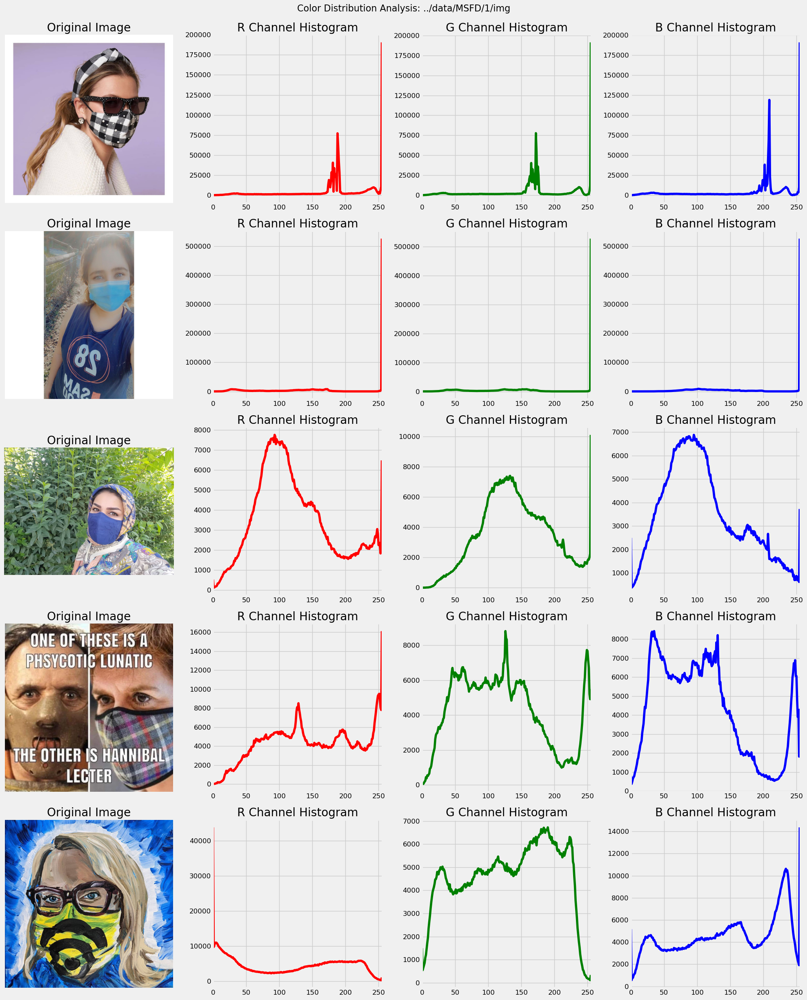

Analyzing color distribution in ../data/MSFD/2/img


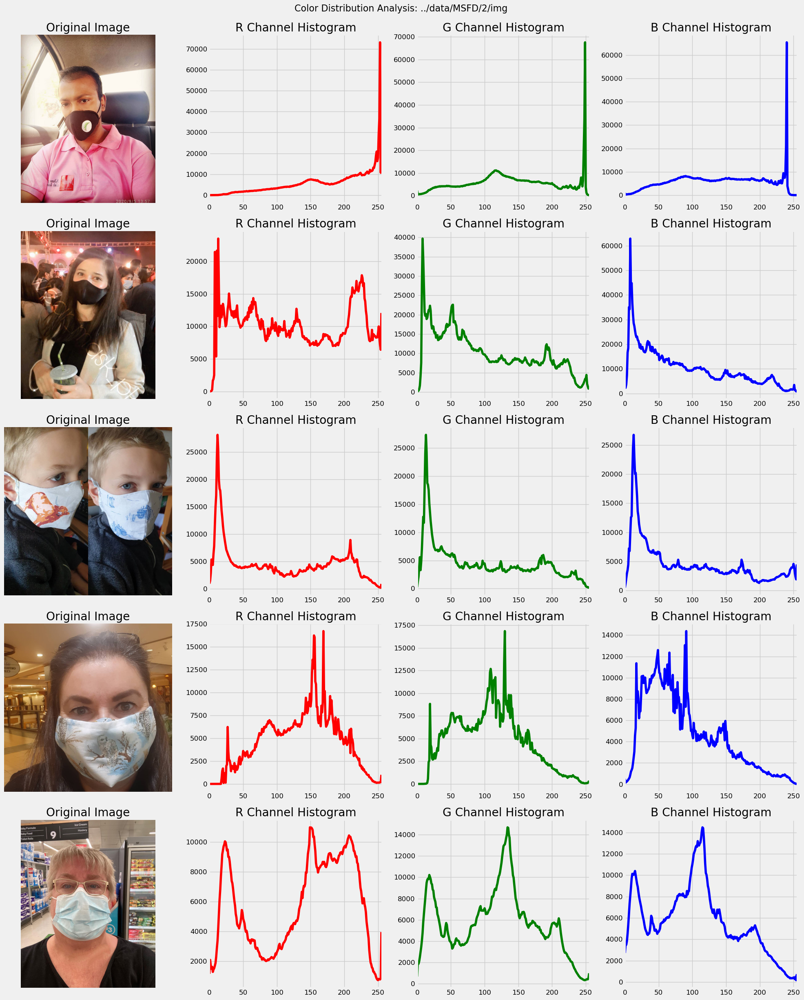

In [62]:
# Cell 10: Analyze color distribution of images
def analyze_color_distribution(directory, sample_size=5):
    """Analyze color distribution in images"""
    image_files = glob.glob(os.path.join(directory, '*.png')) + \
                  glob.glob(os.path.join(directory, '*.jpg'))
    
    if not image_files:
        return
    
    # Sample images
    samples = random.sample(image_files, min(sample_size, len(image_files)))
    
    # Plot color histograms
    fig, axes = plt.subplots(len(samples), 4, figsize=(20, 5*len(samples)))
    if len(samples) == 1:
        axes = [axes]  # Make it iterable
    
    for i, img_path in enumerate(samples):
        # Load image
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Display image
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # Calculate and display histograms
        colors = ['r', 'g', 'b']
        for j, color in enumerate(colors):
            hist = cv2.calcHist([img], [j], None, [256], [0, 256])
            axes[i, j+1].plot(hist, color=color)
            axes[i, j+1].set_title(f'{color.upper()} Channel Histogram')
            axes[i, j+1].set_xlim([0, 256])
    
    plt.tight_layout()
    plt.suptitle(f'Color Distribution Analysis: {directory}', fontsize=16)
    plt.subplots_adjust(top=0.95)
    plt.show()

# Analyze color distribution for img directories
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    for root, _, _ in os.walk(full_path):
        if 'img' in root and 'segmentation' not in root:
            print(f"Analyzing color distribution in {root}")
            analyze_color_distribution(root)

Analyzing mask quality in ../data/MSFD/1/face_crop_segmentation


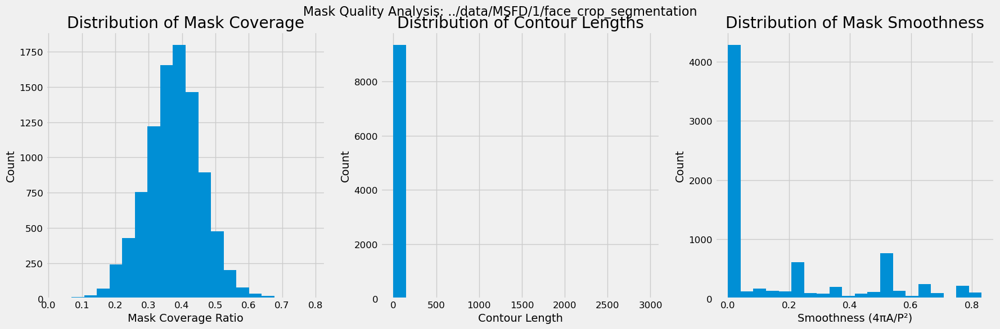

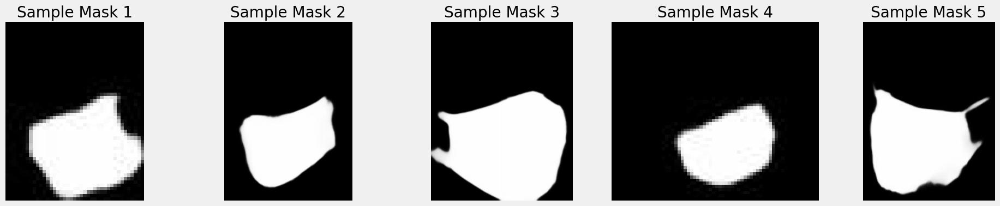

In [63]:
# Cell 11: Analyze mask quality and consistency
def analyze_mask_quality(mask_dir, sample_size=10):
    """Analyze quality and consistency of segmentation masks"""
    mask_files = glob.glob(os.path.join(mask_dir, '*.png')) + \
                 glob.glob(os.path.join(mask_dir, '*.jpg'))
    
    if not mask_files:
        return
    
    # Sample masks
    samples = random.sample(mask_files, min(sample_size, len(mask_files)))
    
    # Metrics to collect
    mask_ratios = []
    mask_contours = []
    mask_smoothness = []
    
    for mask_path in mask_files:
        # Load mask
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            continue
        
        # Calculate mask ratio (coverage)
        ratio = np.sum(mask > 0) / (mask.shape[0] * mask.shape[1])
        mask_ratios.append(ratio)
        
        # Calculate contour length
        contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            contour_length = cv2.arcLength(contours[0], True)
            mask_contours.append(contour_length)
            
            # Calculate smoothness (ratio of contour area to perimeter squared)
            area = cv2.contourArea(contours[0])
            if contour_length > 0:
                smoothness = 4 * np.pi * area / (contour_length * contour_length)
                mask_smoothness.append(smoothness)
    
    # Plot mask statistics
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 3, 1)
    plt.hist(mask_ratios, bins=20)
    plt.xlabel('Mask Coverage Ratio')
    plt.ylabel('Count')
    plt.title('Distribution of Mask Coverage')
    
    if mask_contours:
        plt.subplot(1, 3, 2)
        plt.hist(mask_contours, bins=20)
        plt.xlabel('Contour Length')
        plt.ylabel('Count')
        plt.title('Distribution of Contour Lengths')
    
    if mask_smoothness:
        plt.subplot(1, 3, 3)
        plt.hist(mask_smoothness, bins=20)
        plt.xlabel('Smoothness (4πA/P²)')
        plt.ylabel('Count')
        plt.title('Distribution of Mask Smoothness')
    
    plt.tight_layout()
    plt.suptitle(f'Mask Quality Analysis: {mask_dir}', fontsize=16)
    plt.subplots_adjust(top=0.9)
    plt.show()
    
    # Display sample masks
    plt.figure(figsize=(20, 4))
    for i, mask_path in enumerate(samples[:5]):
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        plt.subplot(1, 5, i+1)
        plt.imshow(mask, cmap='gray')
        plt.title(f'Sample Mask {i+1}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Analyze mask quality for segmentation directories
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    for root, _, _ in os.walk(full_path):
        if 'segmentation' in root:
            print(f"Analyzing mask quality in {root}")
            analyze_mask_quality(root)


In [64]:
# Cell 12: Analyze class distribution if applicable
def analyze_class_distribution(csv_path):
    """Analyze distribution of classes in the dataset"""
    if not os.path.exists(csv_path):
        return
    
    df = pd.read_csv(csv_path)
    
    # Look for potential class columns
    potential_class_cols = [col for col in df.columns if col.lower() in ['class', 'category', 'label', 'type', 'mask']]
    
    if not potential_class_cols:
        print("No obvious class columns found in CSV.")
        return
    
    for col in potential_class_cols:
        # Count values
        class_counts = df[col].value_counts()
        
        # Plot distribution
        plt.figure(figsize=(12, 6))
        sns.countplot(x=col, data=df)
        plt.title(f'Distribution of {col}')
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()
        
        # Print statistics
        print(f"\nClass distribution for {col}:")
        print(class_counts)
        print(f"\nPercentage distribution:")
        print((class_counts / len(df) * 100).round(2))

# Analyze class distribution if CSV exists
csv_path = os.path.join(base_dir, '/1/dataset.csv')
if os.path.exists(csv_path):
    print("Analyzing class distribution in dataset.csv")
    analyze_class_distribution(csv_path)

In [65]:
# Cell 13: Additional analysis for segmentation evaluation
def analyze_segmentation_evaluation(img_dir, crop_dir, mask_dir):
    """Analyze various aspects of segmentation quality"""
    # Find matching images across all three directories
    img_files = glob.glob(os.path.join(img_dir, '*.*'))
    crop_files = glob.glob(os.path.join(crop_dir, '*.*'))
    mask_files = glob.glob(os.path.join(mask_dir, '*.*'))
    
    # Get base filenames without extensions
    img_basenames = [os.path.splitext(os.path.basename(f))[0] for f in img_files]
    crop_basenames = [os.path.splitext(os.path.basename(f))[0] for f in crop_files]
    mask_basenames = [os.path.splitext(os.path.basename(f))[0] for f in mask_files]
    
    # Find common files
    common_files = set(img_basenames).intersection(set(crop_basenames)).intersection(set(mask_basenames))
    
    if not common_files:
        print("No matching files found across all three directories")
        return
    
    # Sample files for analysis
    sample_size = min(5, len(common_files))
    samples = random.sample(list(common_files), sample_size)
    
    # For each sample, analyze the segmentation
    for basename in samples:
        # Find full paths with any extension
        img_path = [f for f in img_files if os.path.splitext(os.path.basename(f))[0] == basename][0]
        crop_path = [f for f in crop_files if os.path.splitext(os.path.basename(f))[0] == basename][0]
        mask_path = [f for f in mask_files if os.path.splitext(os.path.basename(f))[0] == basename][0]
        
        # Load images
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        crop = cv2.imread(crop_path)
        crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
        
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        
        # Create a figure with subplots
        fig, axes = plt.subplots(2, 2, figsize=(12, 10))
        
        # Original image
        axes[0, 0].imshow(img)
        axes[0, 0].set_title('Original Image')
        axes[0, 0].axis('off')
        
        # Face crop
        axes[0, 1].imshow(crop)
        axes[0, 1].set_title('Face Crop')
        axes[0, 1].axis('off')
        
        # Segmentation mask
        axes[1, 0].imshow(mask, cmap='gray')
        axes[1, 0].set_title('Segmentation Mask')
        axes[1, 0].axis('off')
        
        # Overlay mask on crop
        if mask.shape[:2] == crop.shape[:2]:
            overlay = crop.copy()
            overlay[mask > 0] = [255, 0, 0]  # Highlight mask in red
            alpha = 0.5
            combined = cv2.addWeighted(crop, 1 - alpha, overlay, alpha, 0)
            axes[1, 1].imshow(combined)
            axes[1, 1].set_title('Mask Overlay on Crop')
        else:
            axes[1, 1].text(0.5, 0.5, 'Mask and crop dimensions do not match', 
                           horizontalalignment='center', verticalalignment='center')
        axes[1, 1].axis('off')
        
        plt.tight_layout()
        plt.suptitle(f'Segmentation Analysis for {basename}', fontsize=16)
        plt.subplots_adjust(top=0.9)
        plt.show()
        
        # Calculate metrics
        if mask.shape[:2] == crop.shape[:2]:
            mask_area = np.sum(mask > 0)
            crop_area = crop.shape[0] * crop.shape[1]
            coverage = mask_area / crop_area
            
            # Calculate mask contours
            contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            
            print(f"Analysis for {basename}:")
            print(f"  Original image size: {img.shape}")
            print(f"  Face crop size: {crop.shape}")
            print(f"  Mask coverage: {coverage:.2%}")
            if contours:
                print(f"  Number of contours: {len(contours)}")
                print(f"  Main contour length: {cv2.arcLength(contours[0], True):.2f} pixels")
            print()

# Find directories for segmentation evaluation
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    img_dir = None
    crop_dir = None
    mask_dir = None
    
    for root, _, _ in os.walk(full_path):
        if 'img' in root and 'face_crop' not in root and 'segmentation' not in root:
            img_dir = root
        if 'face_crop' in root and 'segmentation' not in root:
            crop_dir = root
        if 'face_crop_segmentation' in root or ('segmentation' in root):
            mask_dir = root
    
    if img_dir and crop_dir and mask_dir:
        print(f"Performing segmentation evaluation for directories in {dir_path}")
        analyze_segmentation_evaluation(img_dir, crop_dir, mask_dir)

Performing segmentation evaluation for directories in /1
No matching files found across all three directories


Analyzing image quality in ../data/MSFD/1/img


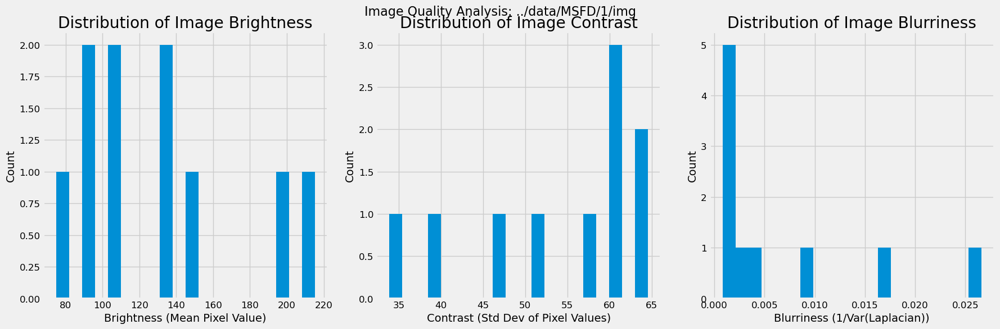

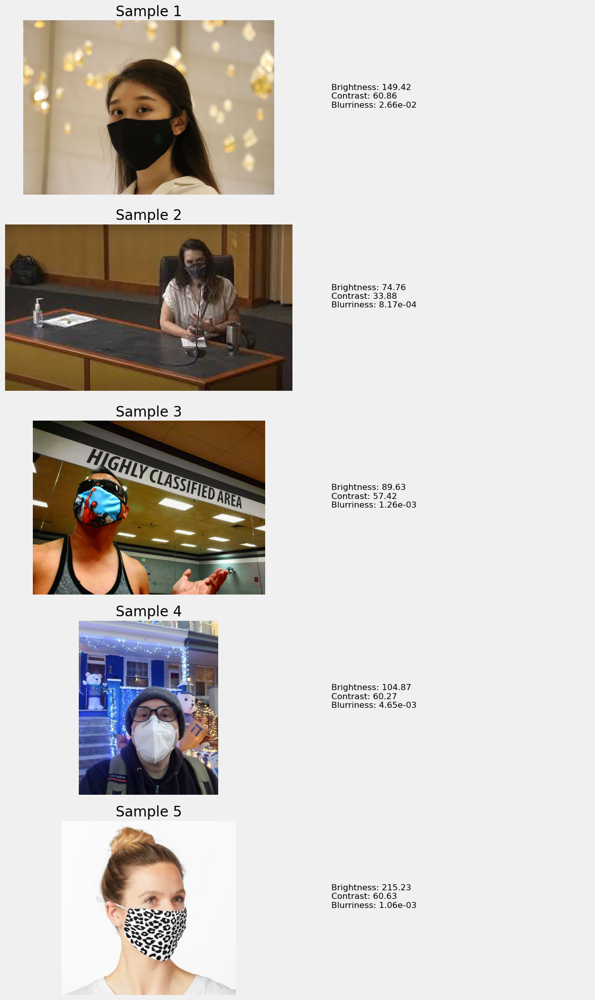

Analyzing image quality in ../data/MSFD/2/img


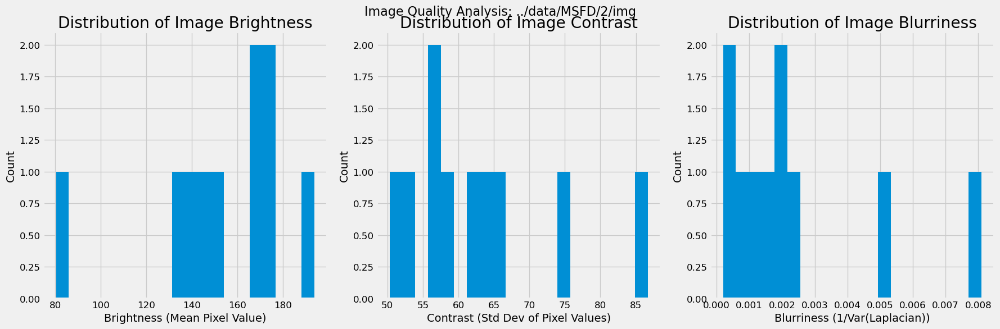

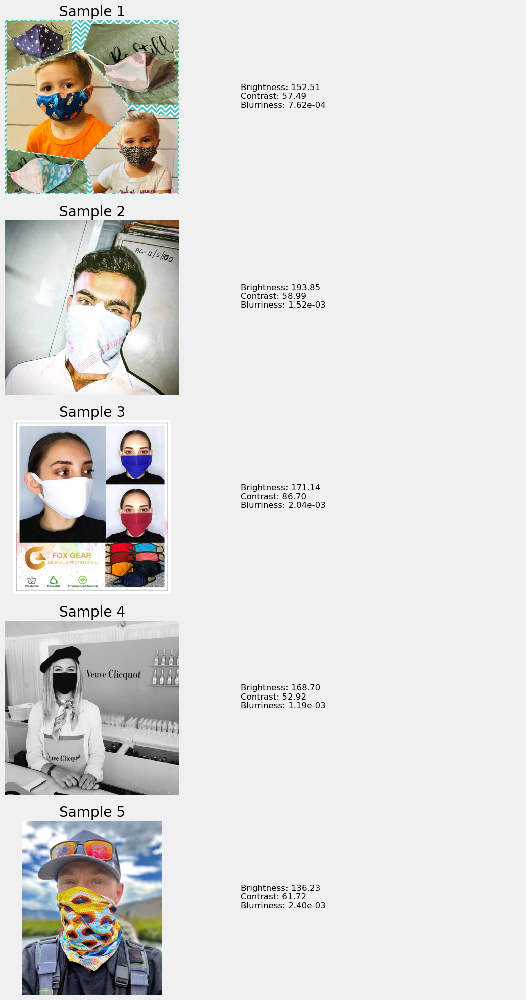

In [66]:
# Cell 14: Analyze image quality and characteristics
def analyze_image_quality(directory, sample_size=10):
    """Analyze various image quality metrics"""
    image_files = glob.glob(os.path.join(directory, '*.png')) + \
                  glob.glob(os.path.join(directory, '*.jpg'))
    
    if not image_files:
        return
    
    # Sample images
    samples = random.sample(image_files, min(sample_size, len(image_files)))
    
    # Metrics to collect
    brightness_values = []
    contrast_values = []
    blurriness_values = []
    
    for img_path in samples:
        # Load image
        img = cv2.imread(img_path)
        if img is None:
            continue
        
        # Convert to grayscale for some metrics
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        # Calculate brightness (mean pixel value)
        brightness = np.mean(gray)
        brightness_values.append(brightness)
        
        # Calculate contrast (standard deviation of pixel values)
        contrast = np.std(gray)
        contrast_values.append(contrast)
        
        # Calculate blurriness (variance of Laplacian)
        laplacian = cv2.Laplacian(gray, cv2.CV_64F)
        blurriness = 1.0 / (np.var(laplacian) + 1e-6)  # Inverted so higher = more blurry
        blurriness_values.append(blurriness)
    
    # Plot metrics
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 3, 1)
    plt.hist(brightness_values, bins=20)
    plt.xlabel('Brightness (Mean Pixel Value)')
    plt.ylabel('Count')
    plt.title('Distribution of Image Brightness')
    
    plt.subplot(1, 3, 2)
    plt.hist(contrast_values, bins=20)
    plt.xlabel('Contrast (Std Dev of Pixel Values)')
    plt.ylabel('Count')
    plt.title('Distribution of Image Contrast')
    
    plt.subplot(1, 3, 3)
    plt.hist(blurriness_values, bins=20)
    plt.xlabel('Blurriness (1/Var(Laplacian))')
    plt.ylabel('Count')
    plt.title('Distribution of Image Blurriness')
    
    plt.tight_layout()
    plt.suptitle(f'Image Quality Analysis: {directory}', fontsize=16)
    plt.subplots_adjust(top=0.9)
    plt.show()
    
    # Display sample images with metrics
    fig, axes = plt.subplots(5, 2, figsize=(12, 20))
    for i, img_path in enumerate(samples[:5]):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
        brightness = np.mean(gray)
        contrast = np.std(gray)
        laplacian = cv2.Laplacian(gray, cv2.CV_64F)
        blurriness = 1.0 / (np.var(laplacian) + 1e-6)
        
        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f'Sample {i+1}')
        axes[i, 0].axis('off')
        
        axes[i, 1].text(0.1, 0.5, f'Brightness: {brightness:.2f}\nContrast: {contrast:.2f}\nBlurriness: {blurriness:.2e}',
                        fontsize=12)
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Analyze image quality for image directories
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    for root, _, _ in os.walk(full_path):
        if 'img' in root and 'segmentation' not in root:
            print(f"Analyzing image quality in {root}")
            analyze_image_quality(root)


In [67]:
# Cell 15: Face detection analysis
def analyze_face_detection(img_dir, crop_dir):
    """Analyze the quality of face detection by comparing original and cropped images"""
    # Find matching images
    img_files = glob.glob(os.path.join(img_dir, '*.*'))
    crop_files = glob.glob(os.path.join(crop_dir, '*.*'))
    
    # Get base filenames without extensions
    img_basenames = [os.path.splitext(os.path.basename(f))[0] for f in img_files]
    crop_basenames = [os.path.splitext(os.path.basename(f))[0] for f in crop_files]
    
    # Find common files
    common_files = set(img_basenames).intersection(set(crop_basenames))
    
    if not common_files:
        print(f"No matching files found between {img_dir} and {crop_dir}")
        return
    
    # Sample at most 5 images for visualization
    sample_size = min(5, len(common_files))
    samples = random.sample(list(common_files), sample_size)
    
    # Calculate size ratios for all matching files
    size_ratios = []
    for basename in common_files:
        # Find full paths with any extension
        img_path = [f for f in img_files if os.path.splitext(os.path.basename(f))[0] == basename][0]
        crop_path = [f for f in crop_files if os.path.splitext(os.path.basename(f))[0] == basename][0]
        
        # Get image dimensions
        img = cv2.imread(img_path)
        crop = cv2.imread(crop_path)
        
        if img is not None and crop is not None:
            img_area = img.shape[0] * img.shape[1]
            crop_area = crop.shape[0] * crop.shape[1]
            size_ratios.append(crop_area / img_area)
    
    # Plot original images with their corresponding crops
    fig, axes = plt.subplots(len(samples), 2, figsize=(12, 5*len(samples)))
    if len(samples) == 1:
        axes = [axes]  # Make it iterable
    
    for i, basename in enumerate(samples):
        # Find full paths with any extension
        img_path = [f for f in img_files if os.path.splitext(os.path.basename(f))[0] == basename][0]
        crop_path = [f for f in crop_files if os.path.splitext(os.path.basename(f))[0] == basename][0]
        
        # Load images
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        crop = cv2.imread(crop_path)
        crop = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
        
        # Calculate size ratio
        img_area = img.shape[0] * img.shape[1]
        crop_area = crop.shape[0] * crop.shape[1]
        ratio = crop_area / img_area
        
        # Plot
        axes[i, 0].imshow(img)
        axes[i, 0].set_title(f'Original Image: {img.shape}')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(crop)
        axes[i, 1].set_title(f'Face Crop: {crop.shape}\nSize Ratio: {ratio:.2%}')
        axes[i, 1].axis('off')
    
    plt.tight_layout()
    plt.suptitle(f'Face Detection Analysis: {img_dir} vs {crop_dir}', fontsize=16)
    plt.subplots_adjust(top=0.95)
    plt.show()
    
    # Plot size ratio distribution
    plt.figure(figsize=(10, 6))
    plt.hist(size_ratios, bins=20)
    plt.xlabel('Face Crop Area / Original Image Area')
    plt.ylabel('Count')
    plt.title('Distribution of Face Crop Size Ratio')
    plt.axvline(np.mean(size_ratios), color='r', linestyle='--', label=f'Mean: {np.mean(size_ratios):.2%}')
    plt.axvline(np.median(size_ratios), color='g', linestyle='--', label=f'Median: {np.median(size_ratios):.2%}')
    plt.legend()
    plt.show()
    
    print(f"Face detection statistics:")
    print(f"  Average size ratio: {np.mean(size_ratios):.2%}")
    print(f"  Median size ratio: {np.median(size_ratios):.2%}")
    print(f"  Minimum size ratio: {np.min(size_ratios):.2%}")
    print(f"  Maximum size ratio: {np.max(size_ratios):.2%}")

# Analyze face detection for matching directories
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    img_dir = None
    crop_dir = None
    
    for root, _, _ in os.walk(full_path):
        if 'img' in root and 'face_crop' not in root:
            img_dir = root
        if 'face_crop' in root and 'segmentation' not in root:
            crop_dir = root
    
    if img_dir and crop_dir:
        print(f"Analyzing face detection: {img_dir} vs {crop_dir}")
        analyze_face_detection(img_dir, crop_dir)

Analyzing face detection: ../data/MSFD/1/img vs ../data/MSFD/1/face_crop
No matching files found between ../data/MSFD/1/img and ../data/MSFD/1/face_crop


Analyzing mask metrics in ../data/MSFD/1/face_crop_segmentation


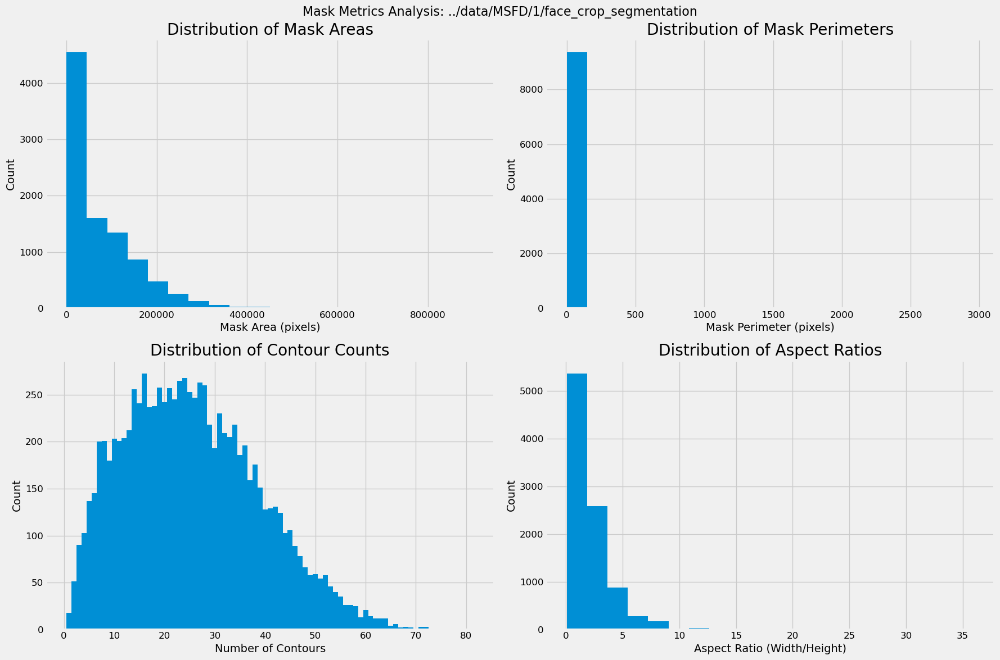

Mask statistics for ../data/MSFD/1/face_crop_segmentation:
  Average mask area: 75960.30 pixels
  Average mask perimeter: 9.34 pixels
  Average contours per mask: 25.55
  Average aspect ratio: 2.02


In [68]:
# Cell 16: Analyze mask precision and recall
def analyze_mask_metrics(mask_dir):
    """Calculate various metrics on mask quality"""
    mask_files = glob.glob(os.path.join(mask_dir, '*.png')) + \
                 glob.glob(os.path.join(mask_dir, '*.jpg'))
    
    if not mask_files:
        return
    
    # Metrics to analyze
    mask_areas = []
    mask_perimeters = []
    contour_counts = []
    aspect_ratios = []
    
    for mask_path in mask_files:
        # Load mask
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            continue
        
        # Calculate mask area
        area = np.sum(mask > 0)
        mask_areas.append(area)
        
        # Calculate mask perimeter and contours
        contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contour_counts.append(len(contours))
        
        if contours:
            # Main contour perimeter
            perimeter = cv2.arcLength(contours[0], True)
            mask_perimeters.append(perimeter)
            
            # Calculate bounding rectangle and aspect ratio
            x, y, w, h = cv2.boundingRect(contours[0])
            if h > 0:
                aspect_ratio = w / h
                aspect_ratios.append(aspect_ratio)
    
    # Plot metrics
    plt.figure(figsize=(18, 12))
    
    plt.subplot(2, 2, 1)
    plt.hist(mask_areas, bins=20)
    plt.xlabel('Mask Area (pixels)')
    plt.ylabel('Count')
    plt.title('Distribution of Mask Areas')
    
    plt.subplot(2, 2, 2)
    plt.hist(mask_perimeters, bins=20)
    plt.xlabel('Mask Perimeter (pixels)')
    plt.ylabel('Count')
    plt.title('Distribution of Mask Perimeters')
    
    plt.subplot(2, 2, 3)
    plt.hist(contour_counts, bins=np.arange(min(contour_counts)-0.5, max(contour_counts)+1.5, 1))
    plt.xlabel('Number of Contours')
    plt.ylabel('Count')
    plt.title('Distribution of Contour Counts')
    
    plt.subplot(2, 2, 4)
    plt.hist(aspect_ratios, bins=20)
    plt.xlabel('Aspect Ratio (Width/Height)')
    plt.ylabel('Count')
    plt.title('Distribution of Aspect Ratios')
    
    plt.tight_layout()
    plt.suptitle(f'Mask Metrics Analysis: {mask_dir}', fontsize=16)
    plt.subplots_adjust(top=0.93)
    plt.show()
    
    # Print statistics
    print(f"Mask statistics for {mask_dir}:")
    print(f"  Average mask area: {np.mean(mask_areas):.2f} pixels")
    print(f"  Average mask perimeter: {np.mean(mask_perimeters):.2f} pixels")
    print(f"  Average contours per mask: {np.mean(contour_counts):.2f}")
    print(f"  Average aspect ratio: {np.mean(aspect_ratios):.2f}")

# Analyze mask metrics for segmentation directories
for dir_path in data_dirs:
    full_path = base_dir + dir_path
    for root, _, _ in os.walk(full_path):
        if 'segmentation' in root:
            print(f"Analyzing mask metrics in {root}")
            analyze_mask_metrics(root)

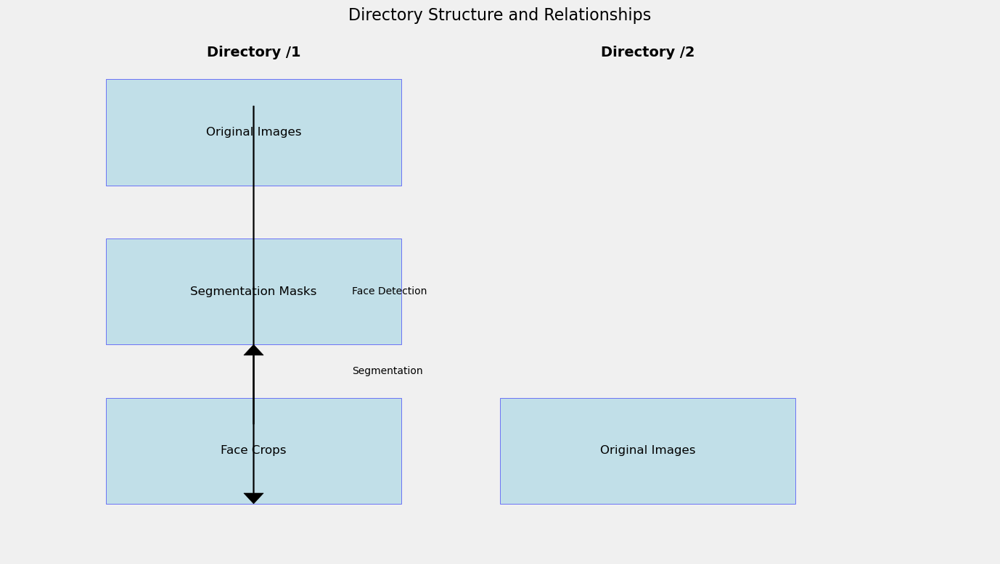

,Directory,face_crop_count,face_crop_dimensions,face_crop_type,face_crop_segmentation_count,face_crop_segmentation_dimensions,face_crop_segmentation_type,img_count,img_dimensions,img_type
0,/1,9383.0,556x731,Color,9383.0,556x731,Color,8226,1080x1350,Color
1,/2,NaN,NaN,NaN,NaN,NaN,NaN,3375,1080x1247,Color


KeyError: 'face_count'

In [69]:
# Cell 17: Visualize relationships between directories
def visualize_directory_relationships():
    """Create a diagram showing relationships between different directories"""
    # First, gather directory types
    dir_types = {}
    for dir_path in data_dirs:
        full_path = base_dir + dir_path
        dir_types[dir_path] = []
        
        for root, _, _ in os.walk(full_path):
            if 'img' in root and 'face_crop' not in root and 'segmentation' not in root:
                dir_types[dir_path].append('Original Images')
            elif 'face_crop' in root and 'segmentation' not in root:
                dir_types[dir_path].append('Face Crops')
            elif 'segmentation' in root or 'face_crop_segmentation' in root:
                dir_types[dir_path].append('Segmentation Masks')
    
    # Plot a diagram
    plt.figure(figsize=(14, 8))
    
    # Create a visual representation of directories
    for i, (dir_path, types) in enumerate(dir_types.items()):
        y_positions = np.linspace(0.2, 0.8, len(types))
        
        for j, dir_type in enumerate(types):
            # Draw box for directory
            rect = plt.Rectangle((0.1 + i*0.4, y_positions[j]-0.1), 0.3, 0.2, 
                                 facecolor='lightblue', edgecolor='blue', alpha=0.7)
            plt.gca().add_patch(rect)
            
            # Add text label
            plt.text(0.1 + i*0.4 + 0.15, y_positions[j], dir_type, 
                     ha='center', va='center', fontsize=12)
            
            # Draw arrows between related directories
            if dir_type == 'Original Images':
                face_crop_idx = next((k for k, t in enumerate(types) if t == 'Face Crops'), None)
                if face_crop_idx is not None:
                    plt.arrow(0.1 + i*0.4 + 0.15, y_positions[j]+0.05, 0, y_positions[face_crop_idx]-y_positions[j]-0.15,
                              head_width=0.02, head_length=0.02, fc='black', ec='black', length_includes_head=True)
                    plt.text(0.1 + i*0.4 + 0.25, (y_positions[j]+y_positions[face_crop_idx])/2, 
                             'Face Detection', fontsize=10, ha='left', va='center')
            
            if dir_type == 'Face Crops':
                seg_mask_idx = next((k for k, t in enumerate(types) if t == 'Segmentation Masks'), None)
                if seg_mask_idx is not None:
                    plt.arrow(0.1 + i*0.4 + 0.15, y_positions[j]+0.05, 0, y_positions[seg_mask_idx]-y_positions[j]-0.15,
                              head_width=0.02, head_length=0.02, fc='black', ec='black', length_includes_head=True)
                    plt.text(0.1 + i*0.4 + 0.25, (y_positions[j]+y_positions[seg_mask_idx])/2, 
                             'Segmentation', fontsize=10, ha='left', va='center')
    
    # Add main directory labels
    for i, dir_path in enumerate(dir_types.keys()):
        plt.text(0.1 + i*0.4 + 0.15, 0.95, f'Directory {dir_path}', 
                 ha='center', va='center', fontsize=14, fontweight='bold')
    
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.axis('off')
    plt.title('Directory Structure and Relationships', fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize directory relationships
visualize_directory_relationships()

# Cell 18: Create a detailed summary table of the dataset
def create_dataset_summary():
    """Create a comprehensive summary table of the dataset"""
    summary_data = []
    
    for dir_path in data_dirs:
        full_path = base_dir + dir_path
        dir_summary = {'Directory': dir_path}
        
        # Collect information about each subdirectory
        for root, _, files in os.walk(full_path):
            subdir_name = os.path.basename(root)
            
            # Count relevant files
            image_files = [f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]
            
            if image_files:
                # Count files
                dir_summary[f'{subdir_name}_count'] = len(image_files)
                
                # Sample an image to get dimensions
                sample_path = os.path.join(root, image_files[0])
                try:
                    sample_img = cv2.imread(sample_path)
                    if sample_img is not None:
                        dir_summary[f'{subdir_name}_dimensions'] = f"{sample_img.shape[1]}x{sample_img.shape[0]}"
                        
                        # Check for color/grayscale
                        if len(sample_img.shape) == 3 and sample_img.shape[2] == 3:
                            dir_summary[f'{subdir_name}_type'] = 'Color'
                        else:
                            dir_summary[f'{subdir_name}_type'] = 'Grayscale'
                except:
                    dir_summary[f'{subdir_name}_dimensions'] = 'Unknown'
                    dir_summary[f'{subdir_name}_type'] = 'Unknown'
        
        summary_data.append(dir_summary)
    
    # Create a DataFrame for visualization
    summary_df = pd.DataFrame(summary_data)
    
    # Display the summary table
    display(summary_df)
    
    # Create a visual summary using Plotly
    fig = make_subplots(rows=len(data_dirs), cols=1, 
                        subplot_titles=[f"Directory {d}" for d in data_dirs],
                        vertical_spacing=0.1)
    
    for i, dir_path in enumerate(data_dirs):
        dir_summary = summary_df[summary_df['Directory'] == dir_path].iloc[0]
        
        # Collect subdirectory counts
        subdirs = [col.split('_')[0] for col in dir_summary.index if col.endswith('_count')]
        counts = [dir_summary[f'{subdir}_count'] for subdir in subdirs]
        
        # Create bar chart
        fig.add_trace(
            go.Bar(x=subdirs, y=counts, text=counts, textposition='auto'),
            row=i+1, col=1
        )
    
    fig.update_layout(height=300*len(data_dirs), width=800, showlegend=False,
                      title_text="Dataset Overview by Directory")
    fig.show()

# Create dataset summary
create_dataset_summary()

Dataset Integrity Issues:
- Directory /1: 8226 original images don't have corresponding face crops
- Directory /1: 9383 face crops don't have corresponding original images
- Directory /1: 1 face crops don't have corresponding segmentation masks
- Directory /1: 1 segmentation masks don't have corresponding face crops
- Directory /2 is missing: Face Crops, Segmentation Masks


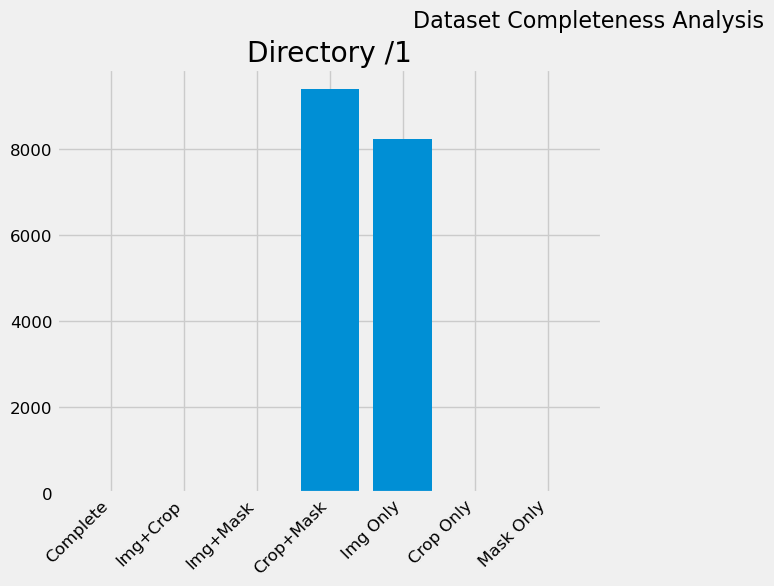

In [70]:
# Cell 19: Analyze dataset completeness and integrity
def analyze_dataset_integrity():
    """Check for completeness and integrity of the dataset"""
    integrity_issues = []
    
    for dir_path in data_dirs:
        full_path = base_dir + dir_path
        
        # Find directories
        img_dir = None
        crop_dir = None
        mask_dir = None
        
        for root, _, _ in os.walk(full_path):
            if 'img' in root and 'face_crop' not in root and 'segmentation' not in root:
                img_dir = root
            elif 'face_crop' in root and 'segmentation' not in root:
                crop_dir = root
            elif 'segmentation' in root or 'face_crop_segmentation' in root:
                mask_dir = root
        
        # Skip if any directory is missing
        if not all([img_dir, crop_dir, mask_dir]):
            missing_dirs = []
            if not img_dir:
                missing_dirs.append('Original Images')
            if not crop_dir:
                missing_dirs.append('Face Crops')
            if not mask_dir:
                missing_dirs.append('Segmentation Masks')
            
            integrity_issues.append(f"Directory {dir_path} is missing: {', '.join(missing_dirs)}")
            continue
        
        # Get image files from each directory
        img_files = set([os.path.splitext(os.path.basename(f))[0] for f in 
                         glob.glob(os.path.join(img_dir, '*.*'))])
        
        crop_files = set([os.path.splitext(os.path.basename(f))[0] for f in 
                          glob.glob(os.path.join(crop_dir, '*.*'))])
        
        mask_files = set([os.path.splitext(os.path.basename(f))[0] for f in 
                          glob.glob(os.path.join(mask_dir, '*.*'))])
        
        # Check for missing corresponding files
        if img_files - crop_files:
            integrity_issues.append(f"Directory {dir_path}: {len(img_files - crop_files)} original images don't have corresponding face crops")
        
        if crop_files - img_files:
            integrity_issues.append(f"Directory {dir_path}: {len(crop_files - img_files)} face crops don't have corresponding original images")
        
        if crop_files - mask_files:
            integrity_issues.append(f"Directory {dir_path}: {len(crop_files - mask_files)} face crops don't have corresponding segmentation masks")
        
        if mask_files - crop_files:
            integrity_issues.append(f"Directory {dir_path}: {len(mask_files - crop_files)} segmentation masks don't have corresponding face crops")
        
        # Check for zero-sized or corrupted images
        for subdir, subdir_name in [(img_dir, 'Original Images'), (crop_dir, 'Face Crops'), (mask_dir, 'Segmentation Masks')]:
            corrupted = 0
            for img_path in glob.glob(os.path.join(subdir, '*.*')):
                try:
                    img = cv2.imread(img_path)
                    if img is None or img.size == 0:
                        corrupted += 1
                except:
                    corrupted += 1
            
            if corrupted > 0:
                integrity_issues.append(f"Directory {dir_path}: {corrupted} corrupted or zero-sized images in {subdir_name}")
    
    # Display integrity issues
    if integrity_issues:
        print("Dataset Integrity Issues:")
        for issue in integrity_issues:
            print(f"- {issue}")
    else:
        print("No dataset integrity issues found.")
    
    # Create a visualization of completeness
    plt.figure(figsize=(12, 6))
    
    for i, dir_path in enumerate(data_dirs):
        full_path = base_dir + dir_path
        
        # Find directories
        img_dir = None
        crop_dir = None
        mask_dir = None
        
        for root, _, _ in os.walk(full_path):
            if 'img' in root and 'face_crop' not in root and 'segmentation' not in root:
                img_dir = root
            elif 'face_crop' in root and 'segmentation' not in root:
                crop_dir = root
            elif 'segmentation' in root or 'face_crop_segmentation' in root:
                mask_dir = root
        
        # Skip if any directory is missing
        if not all([img_dir, crop_dir, mask_dir]):
            continue
        
        # Get image files from each directory
        img_files = set([os.path.splitext(os.path.basename(f))[0] for f in 
                         glob.glob(os.path.join(img_dir, '*.*'))])
        
        crop_files = set([os.path.splitext(os.path.basename(f))[0] for f in 
                          glob.glob(os.path.join(crop_dir, '*.*'))])
        
        mask_files = set([os.path.splitext(os.path.basename(f))[0] for f in 
                          glob.glob(os.path.join(mask_dir, '*.*'))])
        
        # Calculate overlaps
        all_three = len(img_files & crop_files & mask_files)
        img_crop_only = len((img_files & crop_files) - mask_files)
        img_mask_only = len((img_files & mask_files) - crop_files)
        crop_mask_only = len((crop_files & mask_files) - img_files)
        img_only = len(img_files - (crop_files | mask_files))
        crop_only = len(crop_files - (img_files | mask_files))
        mask_only = len(mask_files - (img_files | crop_files))
        
        # Plot
        plt.subplot(1, len(data_dirs), i+1)
        plt.bar(['Complete', 'Img+Crop', 'Img+Mask', 'Crop+Mask', 'Img Only', 'Crop Only', 'Mask Only'],
                [all_three, img_crop_only, img_mask_only, crop_mask_only, img_only, crop_only, mask_only])
        plt.title(f'Directory {dir_path}')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
    
    plt.suptitle('Dataset Completeness Analysis', fontsize=16)
    plt.subplots_adjust(top=0.88)
    plt.show()

# Analyze dataset integrity
analyze_dataset_integrity()